### Bi-lateral filtering


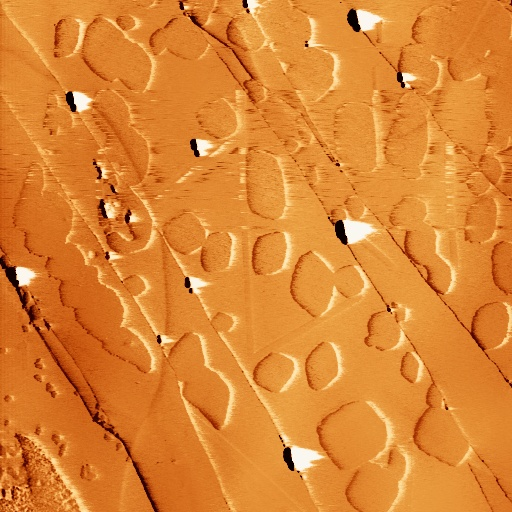

In [ ]:
import cv2
import os
import numpy as np
from google.colab.patches import cv2_imshow

def apply_bilateral_filter(input_folder, output_folder, d=60, sigma_color=60, sigma_space=60):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Get list of all image files in the input folder
    image_files = [f for f in os.listdir(input_folder) if os.path.isfile(os.path.join(input_folder, f))]

    for image_file in image_files:
        # Load the image
        img_path = os.path.join(input_folder, image_file)
        img = cv2.imread(img_path)

        # Apply bilateral filter
        bilFil = cv2.bilateralFilter(img, d, sigma_color, sigma_space)

        # Save the filtered image to the output folder
        output_path = os.path.join(output_folder, image_file)
        cv2.imwrite(output_path, bilFil)

# Example usage
input_folder = '/content/noisy images'  # Replace with your input folder path
output_folder = '/content/denoised_images'  # Replace with your output folder path

apply_bilateral_filter(input_folder, output_folder)

# Optional: Display one of the filtered images
example_filtered_image_path = os.path.join(output_folder, '1_amplitude.jpg')  # Replace with an example image filename
filtered_img = cv2.imread(example_filtered_image_path)
cv2_imshow(filtered_img)

In [ ]:
import cv2
import numpy as np
import os
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def calculate_metrics(noisy_image, denoised_image):
    # Mean Squared Error (MSE)
    mse_value = np.mean((noisy_image - denoised_image) ** 2)

    # Mean Absolute Error (MAE)
    mae_value = np.mean(np.abs(noisy_image - denoised_image))

    # Peak Signal-to-Noise Ratio (PSNR)
    psnr_value = psnr(noisy_image, denoised_image)

    # Structural Similarity Index (SSIM)
    ssim_value, _ = ssim(noisy_image, denoised_image, full=True)

    # Signal-to-Noise Ratio (SNR)
    signal_power = np.sum(noisy_image ** 2)
    noise_power = np.sum((noisy_image - denoised_image) ** 2)
    snr_value = 10 * np.log10(signal_power / noise_power)

    return mse_value, mae_value, psnr_value, ssim_value, snr_value

def evaluate_denoising(noisy_img_folder, denoised_img_folder):
    total_mse = 0
    total_mae = 0
    total_psnr = 0
    total_ssim = 0
    total_snr = 0
    num_images = 0

    noisy_img_paths = sorted([os.path.join(noisy_img_folder, f) for f in os.listdir(noisy_img_folder) if os.path.isfile(os.path.join(noisy_img_folder, f))])
    denoised_img_paths = sorted([os.path.join(denoised_img_folder, f) for f in os.listdir(denoised_img_folder) if os.path.isfile(os.path.join(denoised_img_folder, f))])

    for noisy_img_path, denoised_img_path in zip(noisy_img_paths, denoised_img_paths):
        # Read the images
        noisy_image = cv2.imread(noisy_img_path, cv2.IMREAD_GRAYSCALE)
        denoised_image = cv2.imread(denoised_img_path, cv2.IMREAD_GRAYSCALE)

        if noisy_image is not None and denoised_image is not None:
            mse_value, mae_value, psnr_value, ssim_value, snr_value = calculate_metrics(noisy_image, denoised_image)

            total_mse += mse_value
            total_mae += mae_value
            total_psnr += psnr_value
            total_ssim += ssim_value
            total_snr += snr_value
            num_images += 1

    avg_mse = total_mse / num_images if num_images > 0 else 0
    avg_mae = total_mae / num_images if num_images > 0 else 0
    avg_psnr = total_psnr / num_images if num_images > 0 else 0
    avg_ssim = total_ssim / num_images if num_images > 0 else 0
    avg_snr = total_snr / num_images if num_images > 0 else 0

    return avg_mse, avg_mae, avg_psnr, avg_ssim, avg_snr

# Example usage
noisy_img_folder = '/content/noisy images'
denoised_img_folder = '/content/denoised_images'

avg_mse, avg_mae, avg_psnr, avg_ssim, avg_snr = evaluate_denoising(noisy_img_folder, denoised_img_folder)

print(f"Average MSE: {avg_mse}")
print(f"Average MAE: {avg_mae}")
print(f"Average PSNR: {avg_psnr} dB")
print(f"Average SSIM: {avg_ssim}")
print(f"Average SNR: {avg_snr} dB")

Average MSE: 44.56388600667318
Average MAE: 116.74599347795758
Average PSNR: 30.181765570628823 dB
Average SSIM: 0.8860805588361145
Average SNR: 3.928460706155351 dB


### Median filters


Processed and saved /content/median output/16_phase.jpg


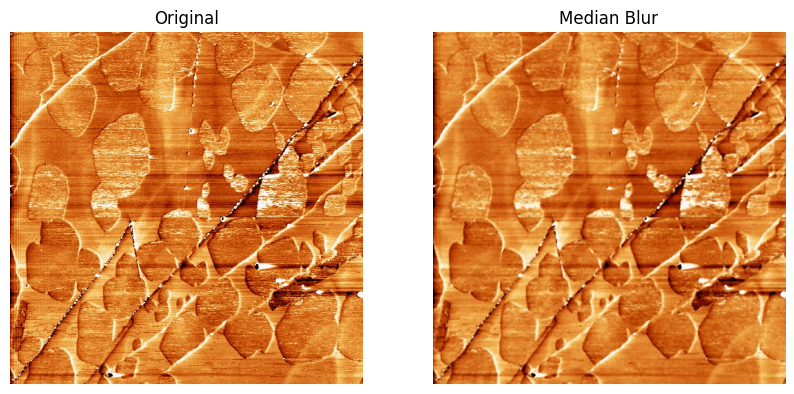

Processed and saved /content/median output/10_topo.jpg


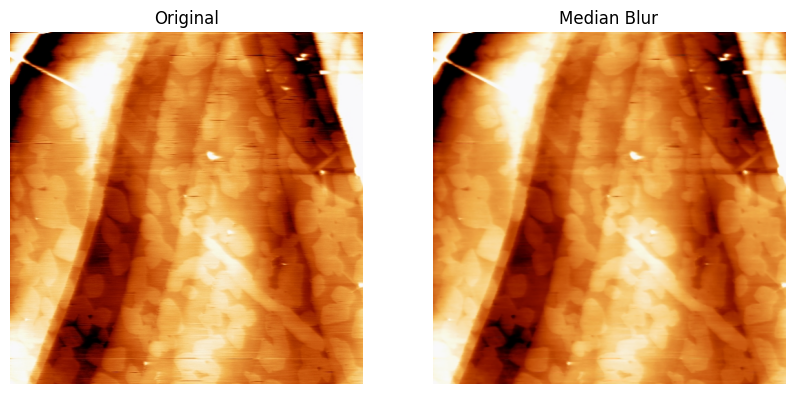

Processed and saved /content/median output/11_amplitude.jpg


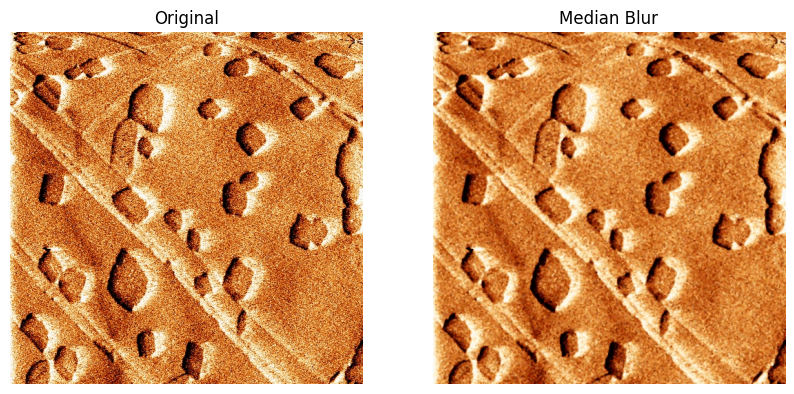

Processed and saved /content/median output/16_amplitude.jpg


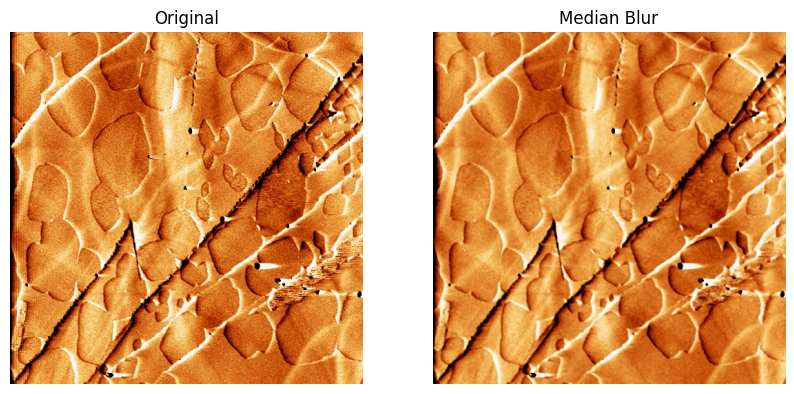

Processed and saved /content/median output/14_topo.jpg


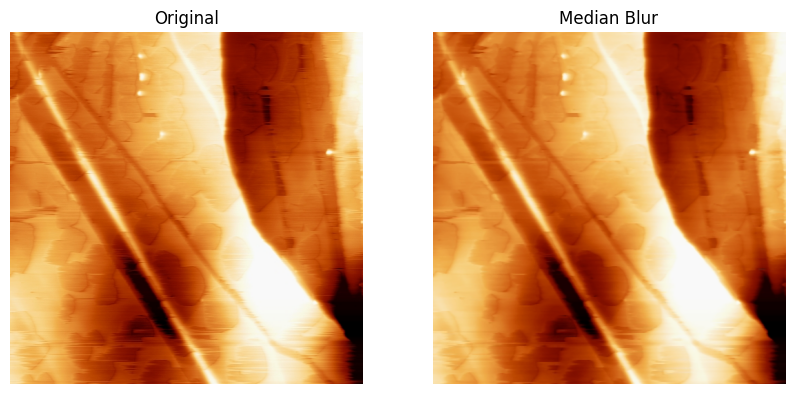

Processed and saved /content/median output/14_amplitude.jpg


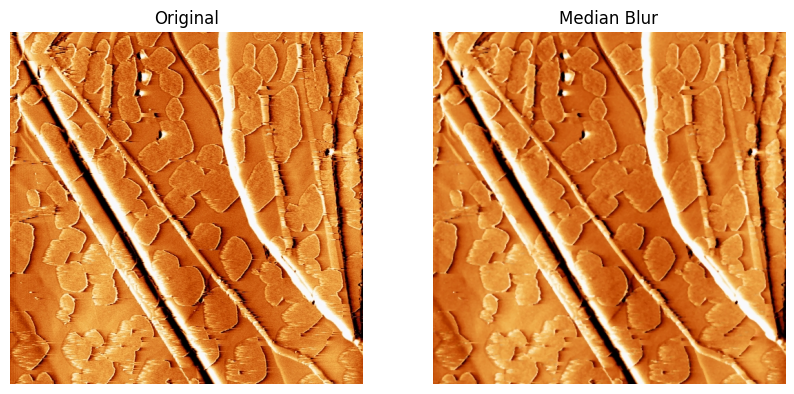

Processed and saved /content/median output/3_amplitude.jpg


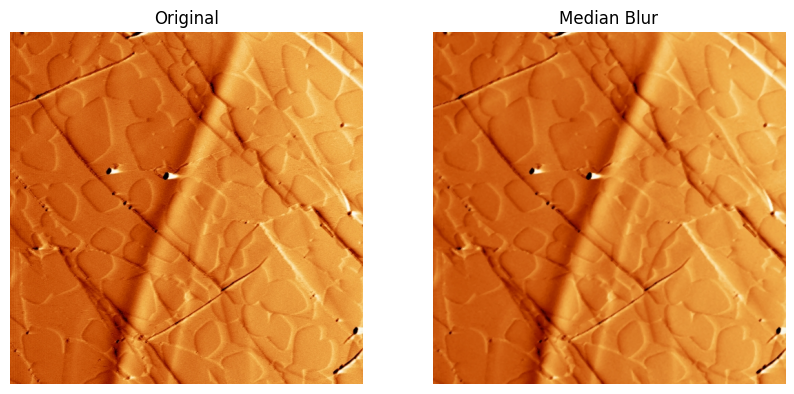

Processed and saved /content/median output/16_topo.jpg


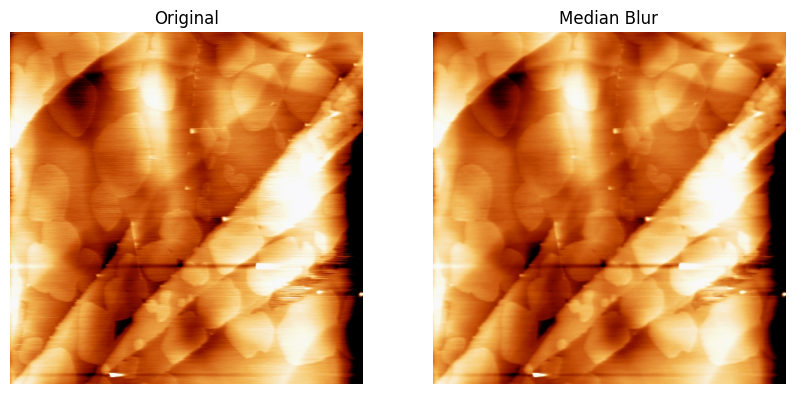

Processed and saved /content/median output/2_topo.jpg


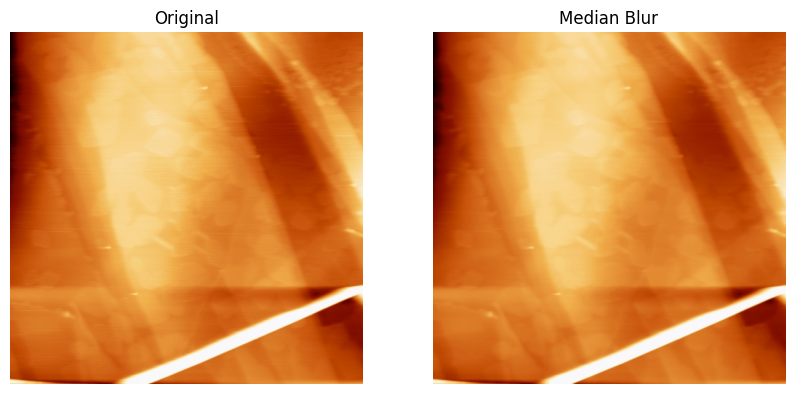

Processed and saved /content/median output/1_phase.jpg


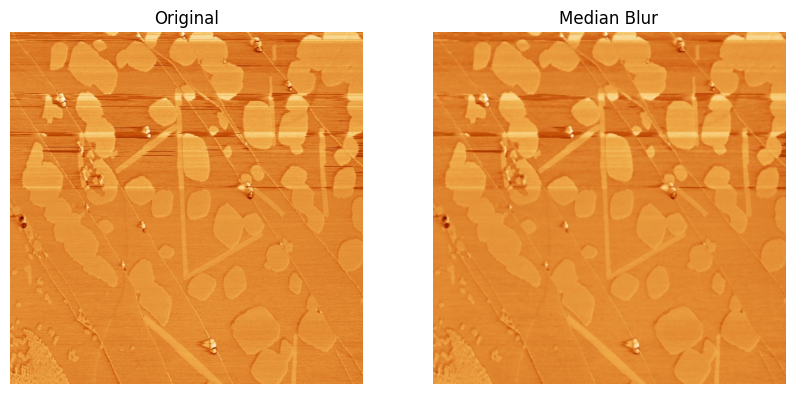

Processed and saved /content/median output/11_topo.jpg


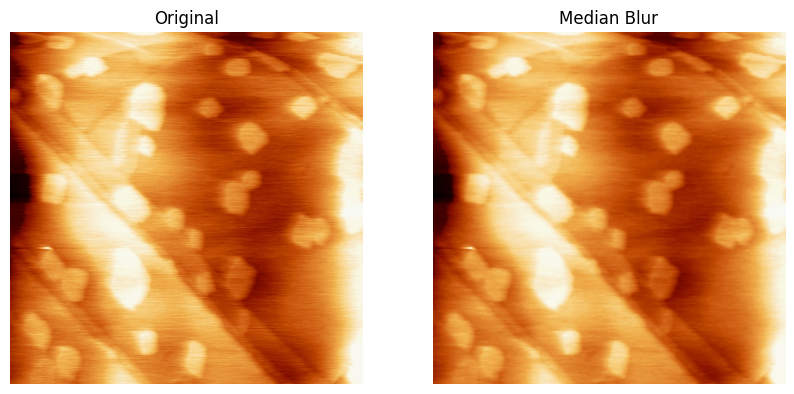

Processed and saved /content/median output/1_topo.jpg


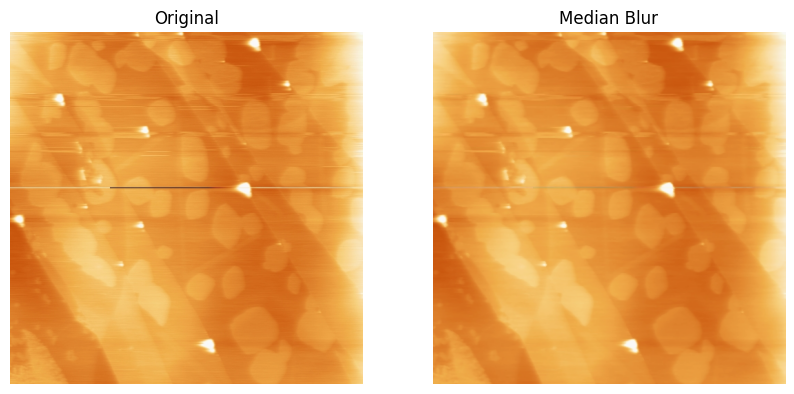

Processed and saved /content/median output/3_phase.jpg


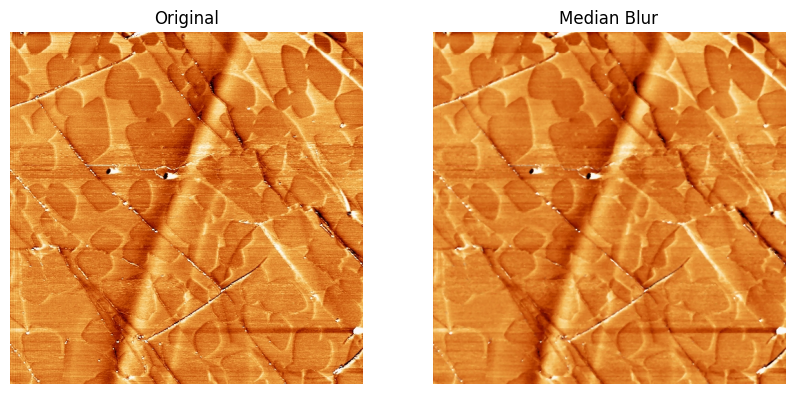

Processed and saved /content/median output/10_phase.jpg


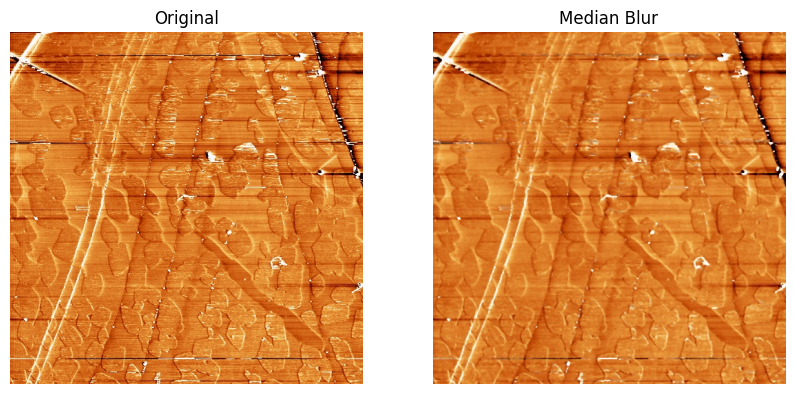

Processed and saved /content/median output/3_topo.jpg


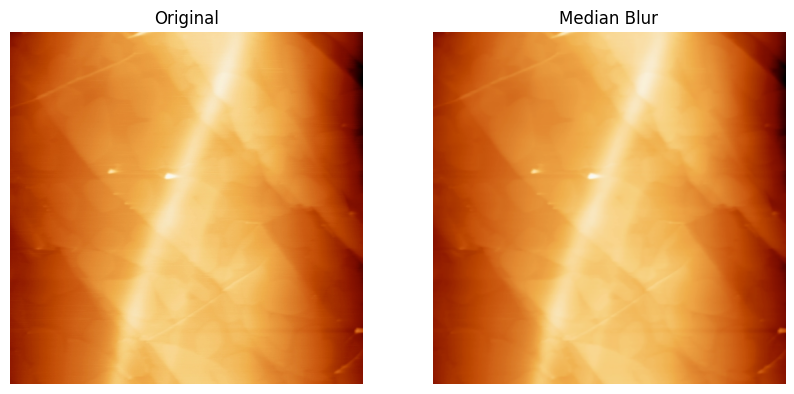

Processed and saved /content/median output/2_phase.jpg


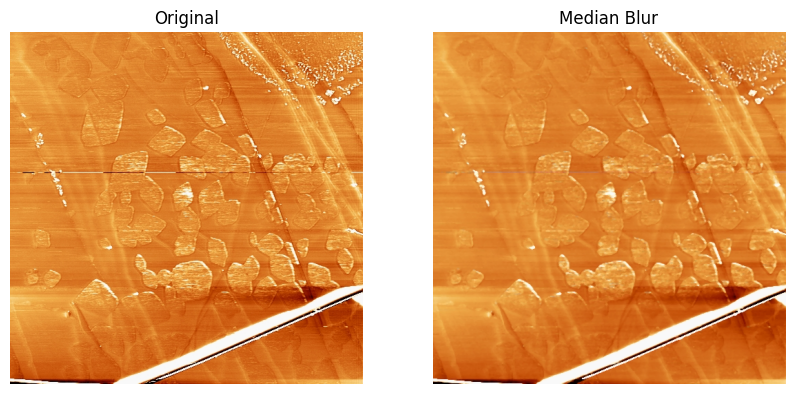

Processed and saved /content/median output/10_amplitude.jpg


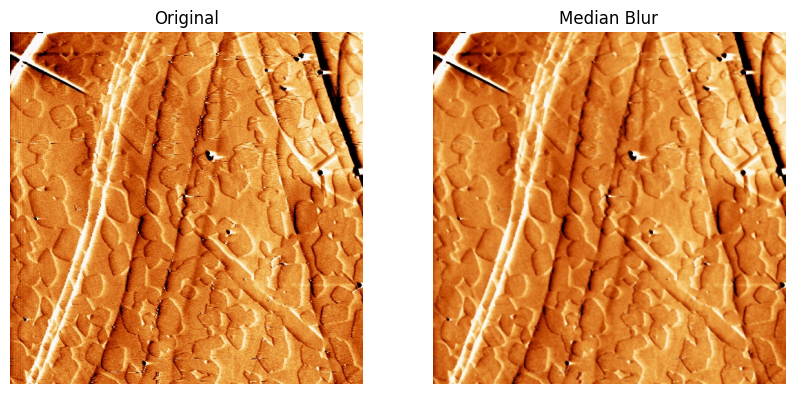

Processed and saved /content/median output/2_amplitude.jpg


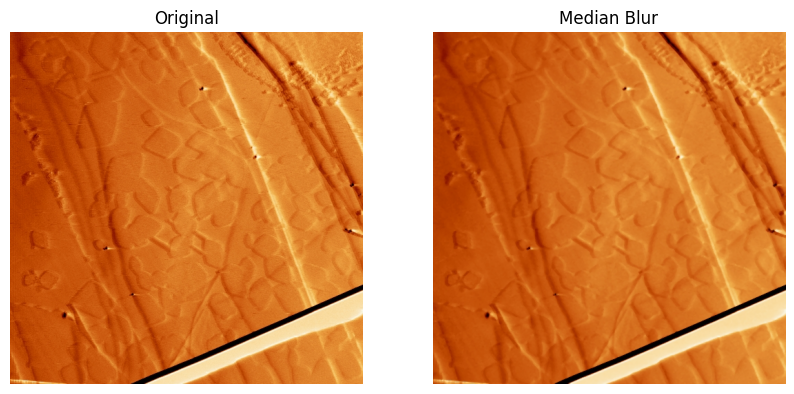

Processed and saved /content/median output/1_amplitude.jpg


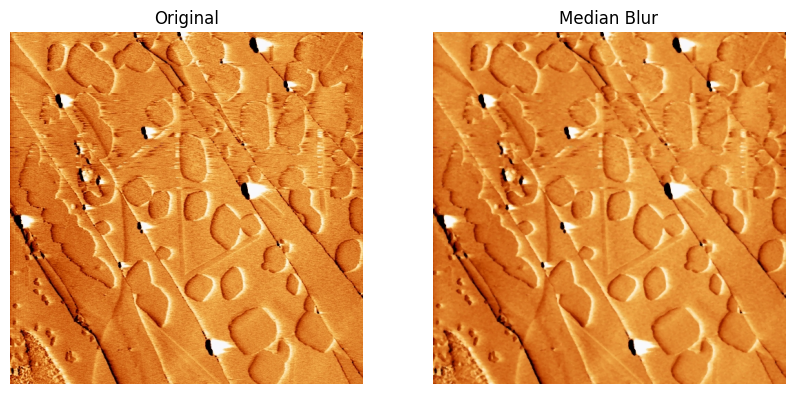

Processed and saved /content/median output/14_phase.jpg


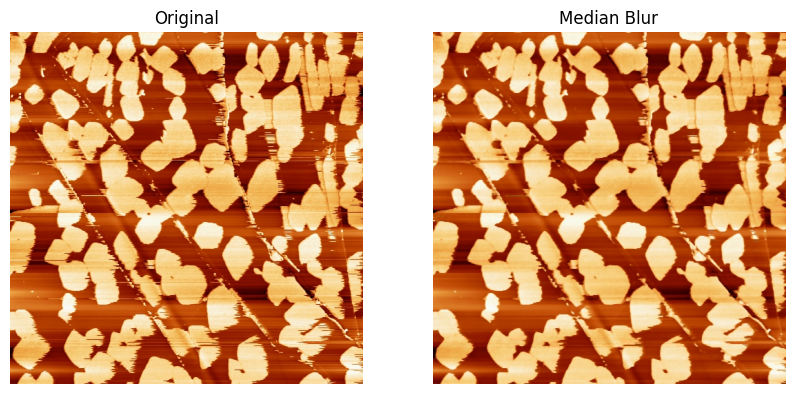

Processed and saved /content/median output/11_phase.jpg


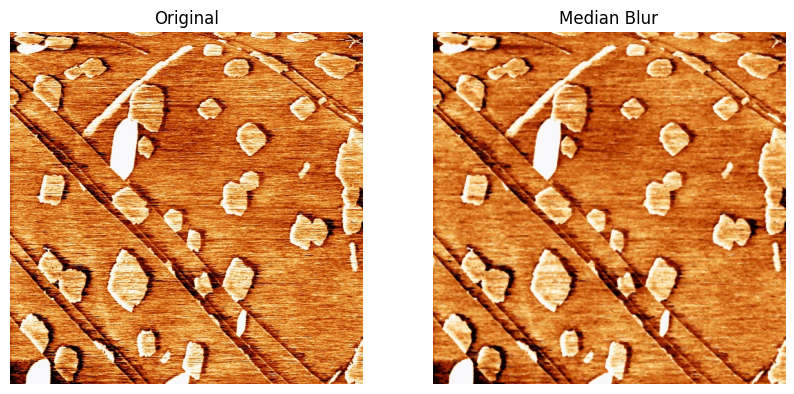

In [ ]:
import cv2
import os
import matplotlib.pyplot as plt
import numpy as np

def apply_median_blur(input_folder, output_folder, ksize=3):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    # Get list of all image files in the input folder
    image_files = [f for f in os.listdir(input_folder) if os.path.isfile(os.path.join(input_folder, f))]

    for image_file in image_files:
        # Load the image
        img_path = os.path.join(input_folder, image_file)
        img = cv2.imread(img_path)

        # Check if the image was loaded successfully
        if img is None:
            print(f"Error: Unable to read image {img_path}")
            continue

        # Apply median blur
        filtered_img = cv2.medianBlur(img, ksize)

        # Save the filtered image to the output folder
        output_path = os.path.join(output_folder, image_file)
        cv2.imwrite(output_path, filtered_img)
        print(f"Processed and saved {output_path}")

        # Optional: Display the original and filtered image
        original_image = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        filtered_image = cv2.cvtColor(filtered_img, cv2.COLOR_BGR2RGB)

        plt.figure(figsize=(10, 5))

        plt.subplot(1, 2, 1)
        plt.title("Original")
        plt.imshow(original_image)
        plt.axis('off')

        plt.subplot(1, 2, 2)
        plt.title("Median Blur")
        plt.imshow(filtered_image)
        plt.axis('off')

        plt.show()

# Example usage
input_folder = '/content/noisy images'  # Replace with your input folder path
output_folder = '/content/median output'  # Replace with your output folder path

apply_median_blur(input_folder, output_folder)

In [ ]:
import cv2
import numpy as np
import os
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def calculate_metrics(noisy_image, denoised_image):
    # Mean Squared Error (MSE)
    mse_value = np.mean((noisy_image - denoised_image) ** 2)

    # Mean Absolute Error (MAE)
    mae_value = np.mean(np.abs(noisy_image - denoised_image))

    # Peak Signal-to-Noise Ratio (PSNR)
    psnr_value = psnr(noisy_image, denoised_image)

    # Structural Similarity Index (SSIM)
    ssim_value, _ = ssim(noisy_image, denoised_image, full=True)

    # Signal-to-Noise Ratio (SNR)
    signal_power = np.sum(noisy_image ** 2)
    noise_power = np.sum((noisy_image - denoised_image) ** 2)
    snr_value = 10 * np.log10(signal_power / noise_power)

    return mse_value, mae_value, psnr_value, ssim_value, snr_value

def evaluate_denoising(noisy_img_folder, denoised_img_folder):
    total_mse = 0
    total_mae = 0
    total_psnr = 0
    total_ssim = 0
    total_snr = 0
    num_images = 0

    noisy_img_paths = sorted([os.path.join(noisy_img_folder, f) for f in os.listdir(noisy_img_folder) if os.path.isfile(os.path.join(noisy_img_folder, f))])
    denoised_img_paths = sorted([os.path.join(denoised_img_folder, f) for f in os.listdir(denoised_img_folder) if os.path.isfile(os.path.join(denoised_img_folder, f))])

    for noisy_img_path, denoised_img_path in zip(noisy_img_paths, denoised_img_paths):
        # Read the images
        noisy_image = cv2.imread(noisy_img_path, cv2.IMREAD_GRAYSCALE)
        denoised_image = cv2.imread(denoised_img_path, cv2.IMREAD_GRAYSCALE)

        if noisy_image is not None and denoised_image is not None:
            mse_value, mae_value, psnr_value, ssim_value, snr_value = calculate_metrics(noisy_image, denoised_image)

            total_mse += mse_value
            total_mae += mae_value
            total_psnr += psnr_value
            total_ssim += ssim_value
            total_snr += snr_value
            num_images += 1

    avg_mse = total_mse / num_images if num_images > 0 else 0
    avg_mae = total_mae / num_images if num_images > 0 else 0
    avg_psnr = total_psnr / num_images if num_images > 0 else 0
    avg_ssim = total_ssim / num_images if num_images > 0 else 0
    avg_snr = total_snr / num_images if num_images > 0 else 0

    return avg_mse, avg_mae, avg_psnr, avg_ssim, avg_snr

# Example usage
noisy_img_folder = '/content/noisy images'
denoised_img_folder = '/content/median output'

avg_mse, avg_mae, avg_psnr, avg_ssim, avg_snr = evaluate_denoising(noisy_img_folder, denoised_img_folder)

print(f"Average MSE: {avg_mse}")
print(f"Average MAE: {avg_mae}")
print(f"Average PSNR: {avg_psnr} dB")
print(f"Average SSIM: {avg_ssim}")
print(f"Average SNR: {avg_snr} dB")

Average MSE: 33.75038346790132
Average MAE: 106.09231767200288
Average PSNR: 30.582268640520976 dB
Average SSIM: 0.7890256329423561
Average SNR: 7.251465587993813 dB


BM3D

sigma = 75


In [ ]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def resize_image(image, target_size):
    return cv2.resize(image, (target_size[1], target_size[0]))

def calculate_metrics(noisy_img_path, denoised_img_path):
    # Read the images
    noisy_image = cv2.imread(noisy_img_path, cv2.IMREAD_GRAYSCALE)
    denoised_image = cv2.imread(denoised_img_path, cv2.IMREAD_GRAYSCALE)

    if noisy_image is None or denoised_image is None:
        raise ValueError("One or both images could not be loaded.")

    # Resize images to the same size
    if noisy_image.shape != denoised_image.shape:
        target_size = (min(noisy_image.shape[0], denoised_image.shape[0]),
                       min(noisy_image.shape[1], denoised_image.shape[1]))
        noisy_image = resize_image(noisy_image, target_size)
        denoised_image = resize_image(denoised_image, target_size)

    # Mean Squared Error (MSE)
    mse = np.mean((noisy_image - denoised_image) ** 2)

    # Mean Absolute Error (MAE)
    mae = np.mean(np.abs(noisy_image - denoised_image))

    # Peak Signal-to-Noise Ratio (PSNR)
    psnr_value = psnr(noisy_image, denoised_image)

    # Structural Similarity Index (SSIM)
    ssim_value, _ = ssim(noisy_image, denoised_image, full=True)

    # Signal-to-Noise Ratio (SNR)
    signal_power = np.sum(noisy_image ** 2)
    noise_power = np.sum((noisy_image - denoised_image) ** 2)
    snr_value = 10 * np.log10(signal_power / noise_power)

    return mse, mae, psnr_value, ssim_value, snr_value

noisy_img_path = '/content/1_amplitude.jpg'
denoised_img_path = '/content/Picture 75.jpg'

mse, mae, psnr_value, ssim_value, snr_value = calculate_metrics(noisy_img_path, denoised_img_path)

print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"PSNR: {psnr_value} dB")
print(f"SSIM: {ssim_value}")
print(f"SNR: {snr_value} dB")


MSE: 52.36094924782806
MAE: 116.99009956405743
PSNR: 27.39763911993802 dB
SSIM: 0.7015917696800973
SNR: 2.951001492275569 dB


sigma = 50


In [ ]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

def resize_image(image, target_size):
    return cv2.resize(image, (target_size[1], target_size[0]))

def calculate_metrics(noisy_img_path, denoised_img_path):
    # Read the images
    noisy_image = cv2.imread(noisy_img_path, cv2.IMREAD_GRAYSCALE)
    denoised_image = cv2.imread(denoised_img_path, cv2.IMREAD_GRAYSCALE)

    if noisy_image is None or denoised_image is None:
        raise ValueError("One or both images could not be loaded.")

    # Resize images to the same size
    if noisy_image.shape != denoised_image.shape:
        target_size = (min(noisy_image.shape[0], denoised_image.shape[0]),
                       min(noisy_image.shape[1], denoised_image.shape[1]))
        noisy_image = resize_image(noisy_image, target_size)
        denoised_image = resize_image(denoised_image, target_size)

    # Mean Squared Error (MSE)
    mse = np.mean((noisy_image - denoised_image) ** 2)

    # Mean Absolute Error (MAE)
    mae = np.mean(np.abs(noisy_image - denoised_image))

    # Peak Signal-to-Noise Ratio (PSNR)
    psnr_value = psnr(noisy_image, denoised_image)

    # Structural Similarity Index (SSIM)
    ssim_value, _ = ssim(noisy_image, denoised_image, full=True)

    # Signal-to-Noise Ratio (SNR)
    signal_power = np.sum(noisy_image ** 2)
    noise_power = np.sum((noisy_image - denoised_image) ** 2)
    snr_value = 10 * np.log10(signal_power / noise_power)

    return mse, mae, psnr_value, ssim_value, snr_value

noisy_img_path = '/content/1_amplitude.jpg'
denoised_img_path = '/content/Picture3.jpg'

mse, mae, psnr_value, ssim_value, snr_value = calculate_metrics(noisy_img_path, denoised_img_path)

print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"PSNR: {psnr_value} dB")
print(f"SSIM: {ssim_value}")
print(f"SNR: {snr_value} dB")

MSE: 47.75821667775698
MAE: 115.44371614604387
PSNR: 28.83747997102127 dB
SSIM: 0.7510672843715226
SNR: 3.350595588792294 dB
